In [1]:
import os, colorcet, param as pm, holoviews as hv, panel as pn, datashader as ds
from holoviews.element import tiles as hvts
from holoviews.operation.datashader import rasterize, shade, spread
import holoviews.operation.datashader as hd
from collections import OrderedDict as odict
import geoviews
from cartopy import crs
import pandas as pd
from astropy.coordinates import Angle
import astropy.units as u

geoviews.extension('bokeh', logo=False)
pn.extension()

from holoviews import opts
from holoviews.plotting.links import DataLink
from astropy.time import Time
import datetime as dt
import numpy as np

from bokeh import models
from bokeh.models import ColumnDataSource, HoverTool
from holoviews.streams import RangeXY
from holoviews.selection import link_selections
from holoviews.operation import decimate

In [8]:
filename = "/users/elowe/repos/antenna-plots/modified_date_ant_pos_with_az_al_small_3k.parquet"

# dataframes for each data set
df = pd.read_parquet(filename)
# df = df[::100]
df
# df = df.head(10000)

,DMJD,RAJ2000,DECJ2000,azimuth,altitude,gal_ra,gal_dec,date_stamp
index,,,,,,,,
317883992,52516.795752,-158.088234,30.510830,327.993101,-12.987242,58.170213,81.381489,2002-08-30
317983791,52518.069132,-73.137329,-10.409350,318.924471,-55.691283,25.413349,-8.250215,2002-09-01
318083791,52533.223032,-84.610874,6.411680,65.050347,-18.861977,35.284120,9.549916,2002-09-16
318183791,52548.033113,-79.499496,-14.247431,1.917864,-65.801311,19.167695,-4.399868,2002-10-01
318283791,52592.027812,-65.573587,6.961025,36.450914,-37.510516,44.475296,-7.000374,2002-11-14
...,...,...,...,...,...,...,...,...
306097482,59690.122650,169.167183,31.479114,345.348780,-18.573317,195.342163,68.930709,2022-04-21
311828151,59692.062176,130.848026,67.216198,0.785961,15.584393,147.802813,35.601780,2022-04-23
293915791,59693.510810,-85.812759,-5.286756,36.281143,-51.412836,24.241199,5.256156,2022-04-24


In [5]:
cmaps  = odict([(n,colorcet.palette[n]) for n in ['fire', 'rainbow4', 'bmy', 'gray', 'kbc', 'blues']])
bg_colors  = {color.capitalize(): color for color in ["grey", "black", "white", "grey"]}
recs = {receiver: receiver for receiver in ['BAO','MBA1.5','NS','342', '800', 'L','Q','Hol','W','MBA','600','Z','RRI','KuWide','K','C','KFPA','1070','Ka','PAF','TKu','X','S','MBA2','Ku','ARGUS','450','UWBR','310']}
backends = {backends: backends for backends in ['MBA1.5', 'MBA', 'JPLRadar', 'CCB', 'CGSR2', 'DCR', 'GASP', 'Mark5', 'Radar', 'Zpect', 'Other', 'GUPPI', 'Spect', 'Mark4', 'S2', 'SpecProc', 'VLBA', 'MBA2', 'VPM', 'BTL', 'VEGAS']}

# randomly creating the receivers and backends
df['Receivers'] = np.random.choice(list(recs), len(df))
df['Backends'] = np.random.choice(list(backends), len(df))

# adding the option of All to the receiver
updict = {"All" : 'All'}

# ** operator for packing and unpacking items in order
recs = {**updict, **recs}

# Made the tools set
my_tools =['box_select','lasso_select','help']

# creating the pairing of backends to the reciever
pairingBackends = {}
for rec in recs:
    selectedReceiver = df[df['Receivers']==rec]
    backendOptions = selectedReceiver['Backends'].drop_duplicates()
    backendOptions = backendOptions.tolist()
    backendOptions.insert(0,'All')
    pairingBackends[rec]= backendOptions
pairingBackends['All'] = ['All','MBA1.5', 'MBA', 'JPLRadar', 'CCB', 'CGSR2', 'DCR', 'GASP', 'Mark5', 'Radar', 'Zpect', 'Other', 'GUPPI', 'Spect', 'Mark4', 'S2', 'SpecProc', 'VLBA', 'MBA2', 'VPM', 'BTL', 'VEGAS']

In [6]:
# Create all the widgets 
background_color = pn.widgets.Select(name="Background Color", value='grey', options=bg_colors)
cmap = pn.widgets.Select(name="Cmap Color", value='fire', options=cmaps)
spread_threshold = pn.widgets.FloatSlider(name='Spread Threshold', start=0, end=1, step=.1, value=.4)
spread_max_pixels = pn.widgets.IntSlider(name='Spread Max Pixels', start=0, end=10, step=1, value=1)
ra_rotation = pn.widgets.IntSlider(name='RA Rotation (Degrees)', start=-180, end=180, step=1, value=0)
dec_rotation = pn.widgets.IntSlider(name='Dec Rotation (Degrees)', start=-180, end=180, step=1, value=0)
receiver_selection = pn.widgets.Select(name='Receivers',value='All',options=recs)
backend_selection = pn.widgets.MultiSelect(name='Backends', value=['All'],options=pairingBackends[receiver_selection.value],size = 8)
date_range_slider = pn.widgets.DateRangeSlider(
    name='Date Range Slider',
    start=Time(df["DMJD"].min(), format="mjd").to_datetime(), end=Time(df["DMJD"].max(), format="mjd").to_datetime(),
    value=(Time(df["DMJD"].min(), format="mjd").to_datetime(), Time(df["DMJD"].max(), format="mjd").to_datetime()),
)

# widgets to hold the place for the projections
ra_dec = pn.widgets
gal_ra_dec = pn.widgets
azi_el =pn.widgets

# List of all the widgets
widgets = [
    background_color,
    cmap,
    spread_threshold,
    spread_max_pixels,
    ra_rotation,
    dec_rotation,
    date_range_slider,
    receiver_selection,
    backend_selection
]

# Add all the widgets to the WidgetBox
option_box = pn.WidgetBox(*widgets)

Row
    [0] Column
        [0] PNG(str)
        [1] WidgetBox
            [0] Select(name='Background Color', options={'Grey': 'grey', ...}, value='grey')
            [1] Select(name='Cmap Color', options=OrderedDict([('fire', ...]), value=['#000000', '#060000', ...])
            [2] FloatSlider(name='Spread Threshold', value=0.4)
            [3] IntSlider(end=10, name='Spread Max Pixels', value=1)
            [4] IntSlider(end=180, name='RA Rotation (Degrees)', start=-180)
            [5] IntSlider(end=180, name='Dec Rotation (Degrees)', start=-180)
            [6] DateRangeSlider(end=datetime.datetime(2022, ..., name='Date Range Slider', start=datetime.datetime(2002, ..., value=(datetime.datetime(2002, ..., value_end=datetime.datetime(2022, ..., value_start=datetime.datetime(2002, ...)
            [7] Select(name='Receivers', options={'All': 'All', ...}, value='All')
            [8] MultiSelect(name='Backends', options=['All', 'MBA1.5', ...], size=8, value=['All'])
    [1] Column
        [0] Column
            [0] Markdown(str)
            [1] HoloViews(DynamicMap)
        [1] Column
            [0] Markdown(str)
            [1] HoloViews(DynamicMap)
        [2] Column
            [0] Markdown(str)
            [1] HoloViews(DynamicMap)
    [2] ParamFunction(function)
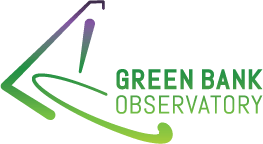

In [7]:
# Add all three projections into a column
my_column = pn.Column(
    pn.Column('# RA/Dec J2000', ra_dec),
    pn.Column('# Galactic Ra/Dec', gal_ra_dec),
    pn.Column('# Az/El', azi_el),
)

# dict to reference the types of projections
refs = {0:['RAJ2000','DECJ2000', 400,crs.Mollweide()],
        1:['gal_ra','gal_dec',400,crs.Mollweide()],
        2:['azimuth','altitude',800,crs.AzimuthalEquidistant()]}

# Creating the plots
def update_proj(event):

    # lists that hold the points and the projections
    list_new_points = []
    
    # Loop through and make each plot
    for i in range(3):
        
        # create condtions to check
        isValidDateRange = (date_range_slider.value_start <  df['date_stamp']) & (df['date_stamp'] < date_range_slider.value_end) 
        isValidReceiver = receiver_selection.value=='All' or df['Receivers']==receiver_selection.value
        isValidBackend = backend_selection.value==['All'] or df['Backends'].isin(backend_selection.value)
        
        # create mask that will only have the points in the valid range
        mask = isValidDateRange & isValidReceiver & isValidBackend

        # get new points based on rotation
        ra_rotated = df[refs[i][0]].where(mask) + ra_rotation.value
        ra_rotated[ra_rotated > 180] -= 360

        dec_rotated = df[refs[i][1]].where(mask) + dec_rotation.value
        dec_rotated[dec_rotated > 90] -= 180

        # New dataframe with the new positions
        new_df = pd.DataFrame({refs[i][0]: ra_rotated, refs[i][1]: dec_rotated})
        
        new_points = geoviews.Points(new_df, [refs[i][0], refs[i][1]])
        new_points = new_points.opts(opts.Points(tools=['box_select', 'lasso_select'],projection=refs[i][3], global_extent=True, width=800, height=refs[i][2]))
        new_projected = geoviews.operation.project_points(new_points, projection=refs[i][3])
        
         # creating the decimated points
        # decimated_points = decimate(new_projected).opts(tools=['lasso_select', 'box_select', 'hover'], projection=refs[i][3], alpha=0)
        
#         # Shading the data
#         hv_shaded = hv.operation.datashader.datashade(rasterize(hv.DynamicMap(new_projected)), dynamic=True, precompute=True, cmap=cmap.value)
#         hv_spread = hv.operation.datashader.dynspread(hv_shaded, threshold=spread_threshold.value, max_px=spread_max_pixels.value)
#         hv_spread = hv_spread.opts(tools=['box_select','lasso_select','help'], bgcolor=background_color.value,projection=refs[i][3], global_extent=True, frame_width=800, frame_height=refs[i][2])
        
#         # for the quadmesh
        dynamic = hv.util.Dynamic(hd.aggregate(new_projected, width=12, height=12, streams=[RangeXY]),operation=hv.QuadMesh).opts(tools=['hover'], projection=refs[i][3],alpha=0, hover_alpha=0.6)
        
        # my_column[i][1] = (hv_spread * dynamic) 
        list_new_points.append(new_points)
    
    # Calling the method to link the plots
    link(list_new_points)

# dataset and table link for linking the projections to the table
dataset = hv.Dataset(df)
table_link = link_selections.instance()

# function to create the datalink. only working with the unshaded data. 
def link(ls_points):
    
    #table link that only works with one projection at a time
    ls_points[0] = table_link(ls_points[0])
    
    # set columns  
    my_column[0][1] = ls_points[0] 
    my_column[1][1] = ls_points[1]
    my_column[2][1] = ls_points[2]

    
# creates the selection table
@pm.depends(table_link.param.selection_expr)
def selection_table(_):
    return hv.Table(dataset.select(table_link.selection_expr)).opts(width=700, height=200)  

# the method that populates the beckends based on the receiver selected
@pn.depends(receiver_selection.param.value, watch=True)
def _update_backend(receiver_selection):
    backendList = pairingBackends[receiver_selection]
    backend_selection.options = backendList
    valueList = [backendList[0]]
    backend_selection.value = valueList
    
# To loop through all the widgets  
def add_trigger(widget):
    widget.param.watch(update_proj, 'value')

# position.param.watch(update_proj, 'value')
# position.param.trigger('value')
# replaced by:
# widget.param.trigger('value')
for widget in widgets:
    add_trigger(widget)

# GBO logo 
logo = "https://i0.wp.com/greenbankobservatory.org/wp-content/uploads/2016/10/logo_purp-green_grad.png"


# Adding them to a row
pn.Row(
    pn.Column(logo,
    option_box),
    my_column, selection_table
# )